<a href="https://www.kaggle.com/code/aswinx22/vision?scriptVersionId=267242219" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# **Crop Disease Detection**

## **Introduction**:

> #### *Problem Statement*: 
> > Few farmers are facing with issue with in the farm. There are lots of problems in the agricultural sector in the perspective of the farmer, but we can help them by integrating the AI Technology. Even after selecting and growing the crop in the field, few
crop diseases are not identified by the farmer which results to decrease in the crop yield. This is the main problem in the field so we are going to solve this issue by developing a model which can recognize the disease that is caused by the input of an image of the diseased plant. By
tackling this, we can increase the crop yield and maintain the crop production.

> #### *Overview of the project*:
> > This project involves building and loading the data, **Plant Village Dataset**, Exploratory Data Analysis, Model Building and Training.  
> #### *Goal of this project*:
> > The goal of this project is to build individual models for each vegetable as per the user wish and to observe the performance metrics of the model
> #### *Result*: 
> > With this we can hence use the model for any web application for crop managment systems or Crop Disease detection system

### Importing all the required libraries

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import seaborn as sns
from tensorflow.python.client import device_lib
device_lib.list_local_devices()
import os
from tensorflow.keras.utils import image_dataset_from_directory
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
import math
from tensorflow import keras
import tensorflow_addons as tfa
from tensorflow.keras import layers
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from PIL import Image, ImageEnhance
import random
import cv2
from sklearn.preprocessing import MultiLabelBinarizer
from tqdm import tqdm
from tensorflow.keras.utils import plot_model
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard
import tensorflow_hub as hub
from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model
from tensorflow.keras.models import load_model
import warnings
warnings.filterwarnings('ignore')

## 1. Exploratory Data Analysis

### Defining a function to get the path for folder paths

In [2]:
def get_path(plant_dir:str, dir_test:str):
    if dir_test == 'Test':
        return '/kaggle/input/plant-village-dataset-updated/' + plant_dir + '/Test'
    elif dir_test == 'Train':
        return '/kaggle/input/plant-village-dataset-updated/' + plant_dir + '/Train'
    elif dir_test == 'Valid':
        return '/kaggle/input/plant-village-dataset-updated/' + plant_dir + '/Val'
    
plant_dirs = os.listdir("/kaggle/input/plant-village-dataset-updated")
plant_dirs

['Tomato',
 'Apple',
 'Bell Pepper',
 'Strawberry',
 'Corn (Maize)',
 'Peach',
 'Grape',
 'Cherry',
 'Potato']

### Printing the information about the Training set, the directories and the images

In [3]:
img_dim = (256,256)
batch_size = 32
num_channels = 3
input_size = (batch_size, img_dim[0], img_dim[1], num_channels)
train_dataset = {}

print("-_-_-_-_-_-_-_-_-_-_Images & Classes for Training-_-_-_-_-_-_-_-_-_-_")
for plant in plant_dirs:
    print('>>> No of Images & Classes in "{}" directory'.format(plant))
    train_dataset[plant] = image_dataset_from_directory(get_path(plant, "Train"),
                                                        shuffle=True,
                                                        labels = 'inferred',
                                                        label_mode = 'int',
                                                        image_size = img_dim,
                                                        batch_size = batch_size)

-_-_-_-_-_-_-_-_-_-_Images & Classes for Training-_-_-_-_-_-_-_-_-_-_
>>> No of Images & Classes in "Tomato" directory
Found 11108 files belonging to 6 classes.
>>> No of Images & Classes in "Apple" directory
Found 7771 files belonging to 4 classes.
>>> No of Images & Classes in "Bell Pepper" directory
Found 3901 files belonging to 2 classes.
>>> No of Images & Classes in "Strawberry" directory
Found 3598 files belonging to 2 classes.
>>> No of Images & Classes in "Corn (Maize)" directory
Found 7316 files belonging to 4 classes.
>>> No of Images & Classes in "Peach" directory
Found 3566 files belonging to 2 classes.
>>> No of Images & Classes in "Grape" directory
Found 7222 files belonging to 4 classes.
>>> No of Images & Classes in "Cherry" directory
Found 3509 files belonging to 2 classes.
>>> No of Images & Classes in "Potato" directory
Found 5702 files belonging to 3 classes.


### Printing the disease names of each plant

In [4]:
classes  ={}
for plant in plant_dirs:
    print(">>> Classes in {} dataset :-".format(plant))
    classes[plant] = []
    for num, cat in enumerate(train_dataset[plant].class_names, start=1):
        classes[plant].append(cat)
        print(num, cat)
    print("\n")

>>> Classes in Tomato dataset :-
1 Bacterial Spot
2 Early Blight
3 Healthy
4 Late Blight
5 Septoria Leaf Spot
6 Yellow Leaf Curl Virus


>>> Classes in Apple dataset :-
1 Apple Scab
2 Black Rot
3 Cedar Apple Rust
4 Healthy


>>> Classes in Bell Pepper dataset :-
1 Bacterial Spot
2 Healthy


>>> Classes in Strawberry dataset :-
1 Healthy
2 Leaf Scorch


>>> Classes in Corn (Maize) dataset :-
1 Cercospora Leaf Spot
2 Common Rust 
3 Healthy
4 Northern Leaf Blight


>>> Classes in Peach dataset :-
1 Bacterial Spot
2 Healthy


>>> Classes in Grape dataset :-
1 Black Rot
2 Esca (Black Measles)
3 Healthy
4 Leaf Blight


>>> Classes in Cherry dataset :-
1 Healthy
2 Powdery Mildew


>>> Classes in Potato dataset :-
1 Early Blight
2 Healthy
3 Late Blight




### Plotting few random samples from each plant directory

>>>> Sample Images of "Tomato" dataset


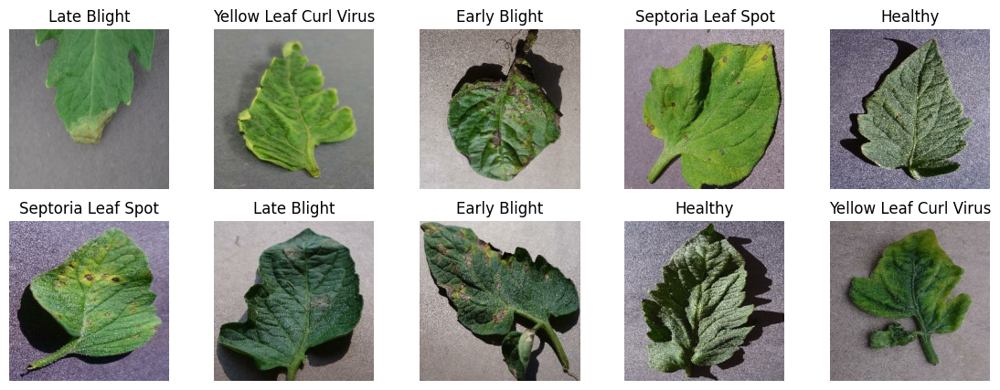




>>>> Sample Images of "Apple" dataset


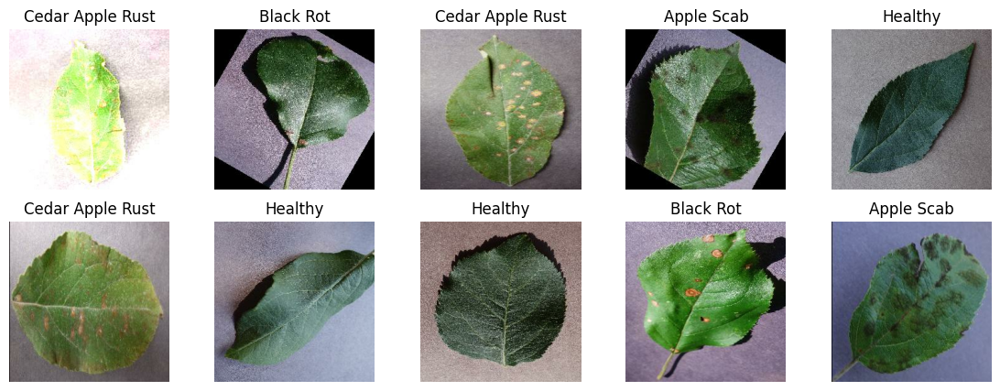




>>>> Sample Images of "Bell Pepper" dataset


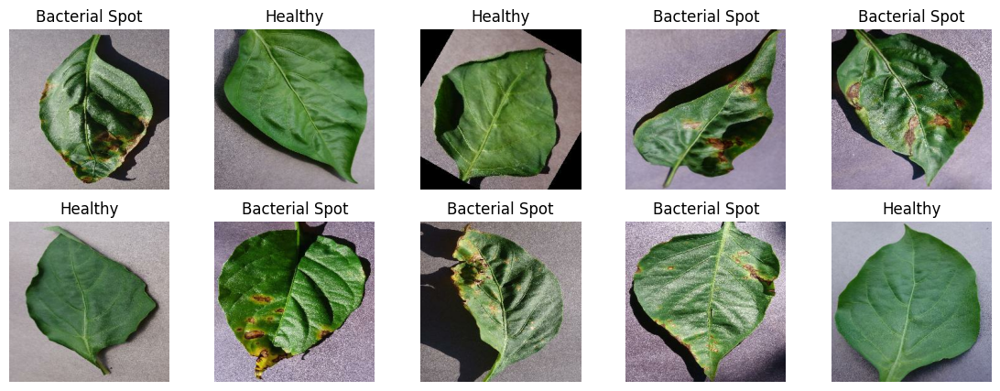




>>>> Sample Images of "Strawberry" dataset


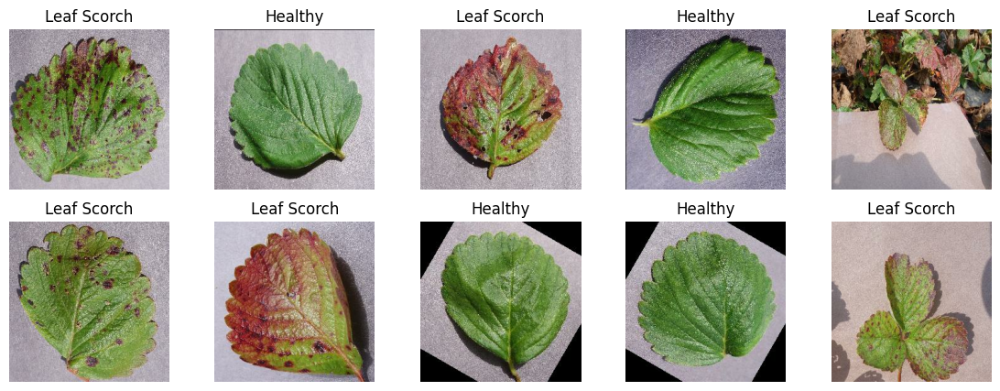




>>>> Sample Images of "Corn (Maize)" dataset


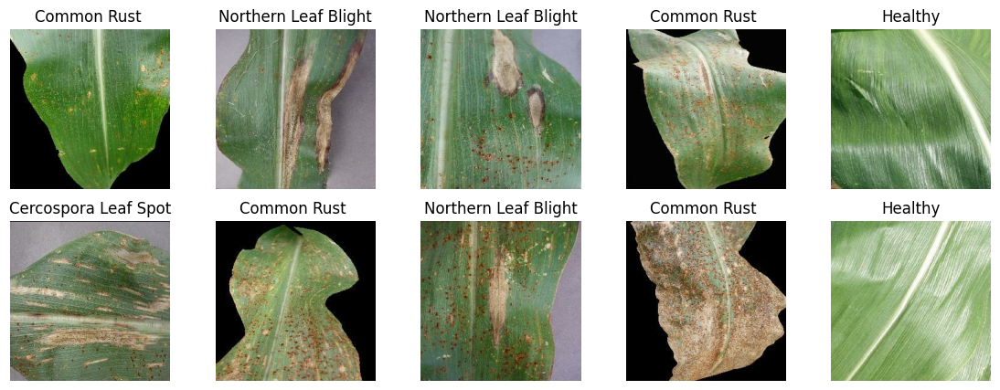




>>>> Sample Images of "Peach" dataset


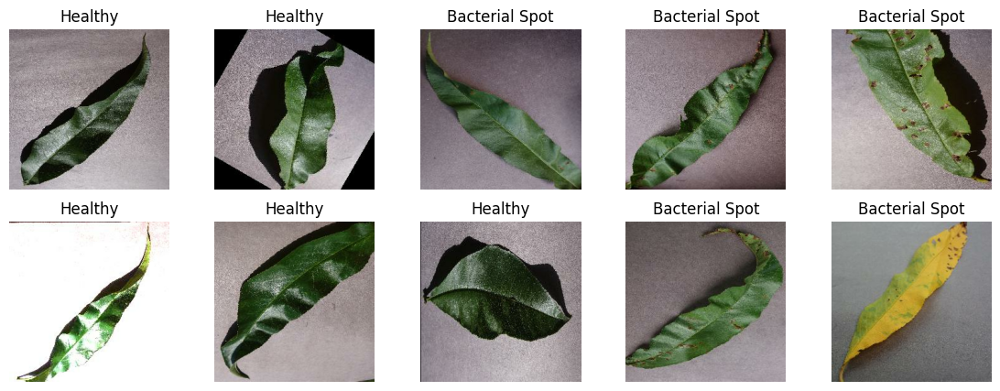




>>>> Sample Images of "Grape" dataset


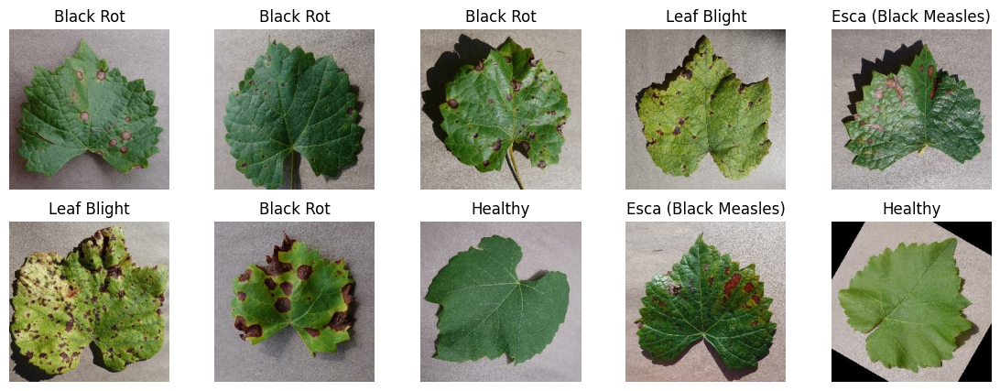




>>>> Sample Images of "Cherry" dataset


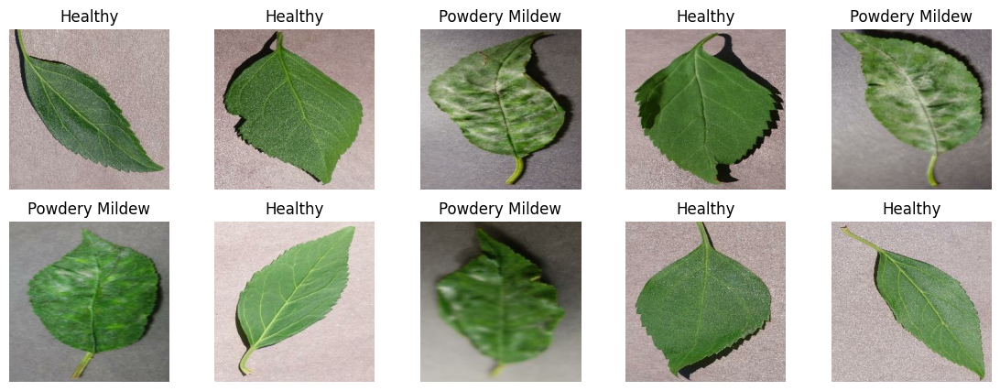




>>>> Sample Images of "Potato" dataset


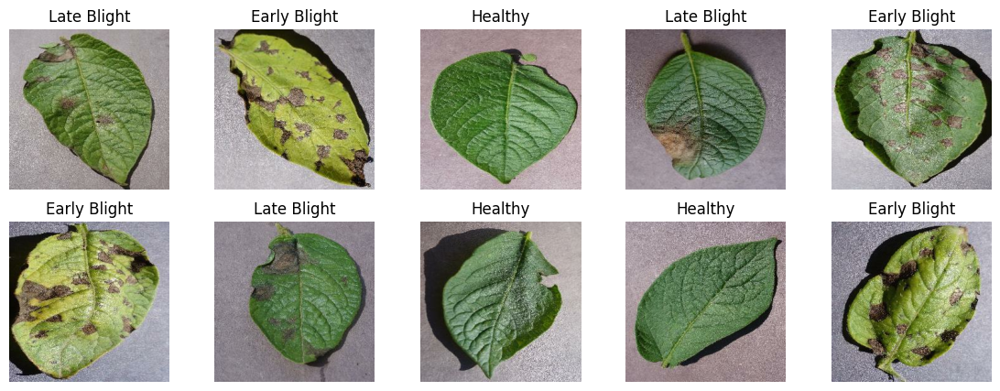

In [5]:
for plant in plant_dirs:
    print('>>>> Sample Images of "{}" dataset'.format(plant))
    plt.figure(figsize=(14,5))
    for image_batch, image_label in train_dataset[plant].take(1):
        for i in range(10):
            plt.subplot(2,5,i+1)
            plt.imshow(image_batch[i].numpy().astype('uint8'))
            plt.title(classes[plant][image_label[i]])
            plt.axis('off')
        plt.show()
    print("\n\n")

### Plotting the standardized images for randome plant leaf images

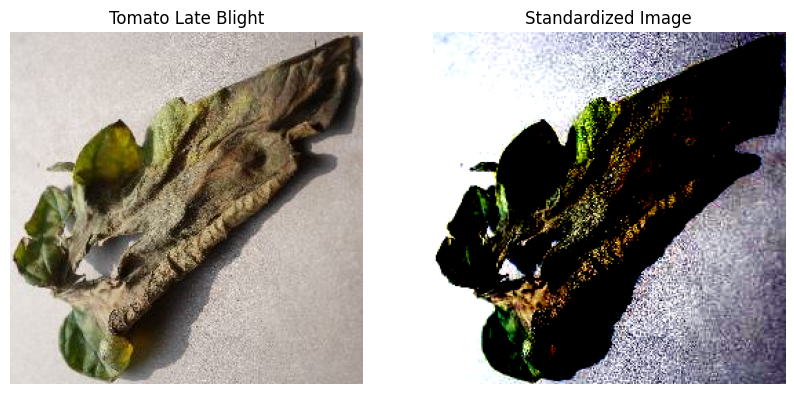

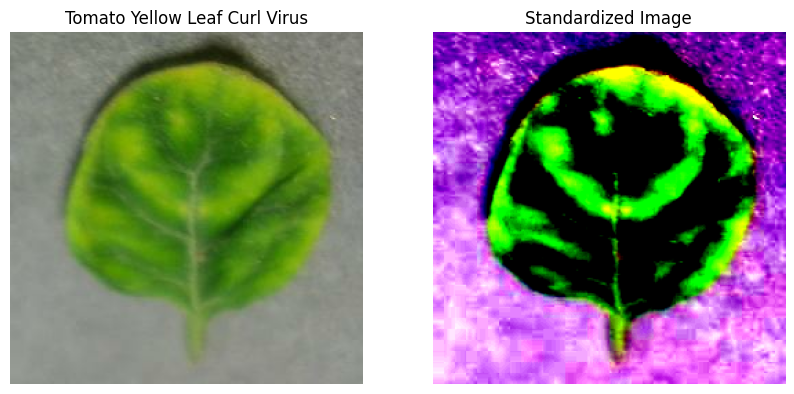

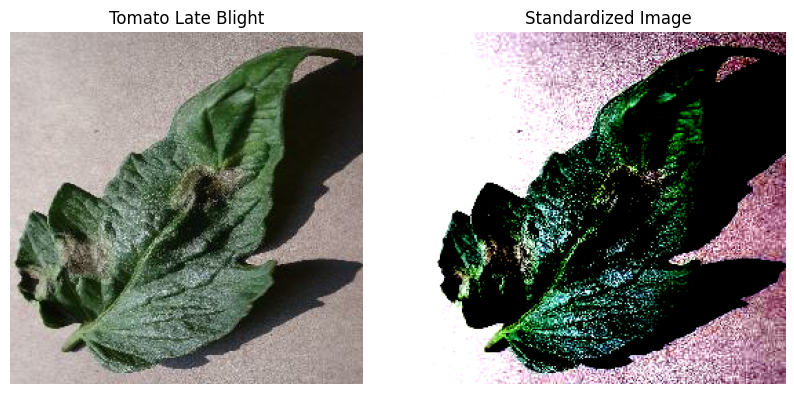

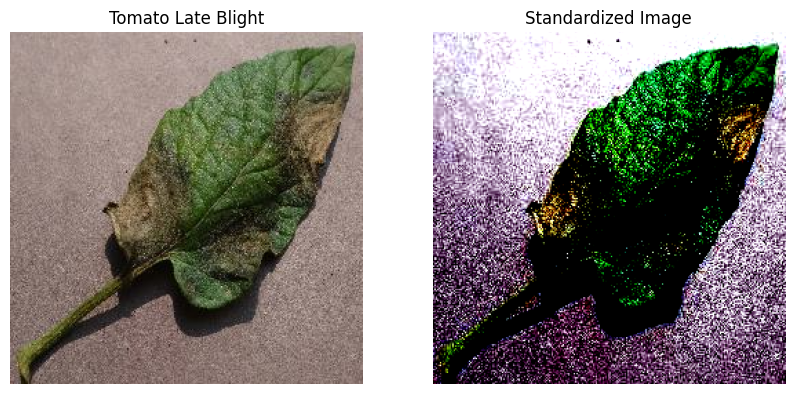

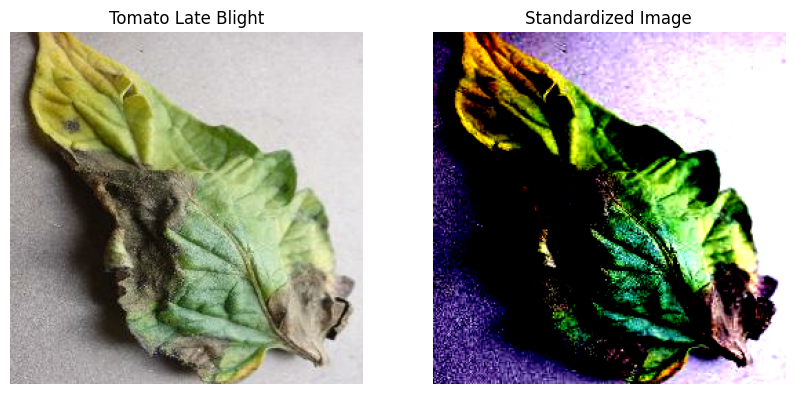

In [6]:
def std_img(img):
    img_flat = img.reshape(-1,3)
    scaler = StandardScaler()
    img_std = scaler.fit_transform(img_flat)
    img_std = img_std.reshape(256,256,3)
    return img_std

tomato_img = []
tomato_label = []
for img,label in train_dataset["Tomato"].take(1):
    for i in range(5):
        tomato_img.append(img[i])
        tomato_label.append(classes["Tomato"][label[i]])
        
for i in range(5):        
    nik = np.array(tomato_img[i]).astype('uint8')
    img_std = std_img(nik)


    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(nik)
    plt.title("Tomato "+tomato_label[i])
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(img_std)
    plt.title('Standardized Image')
    plt.axis('off')
plt.show()

### Plotting the number of total images of each plant directory

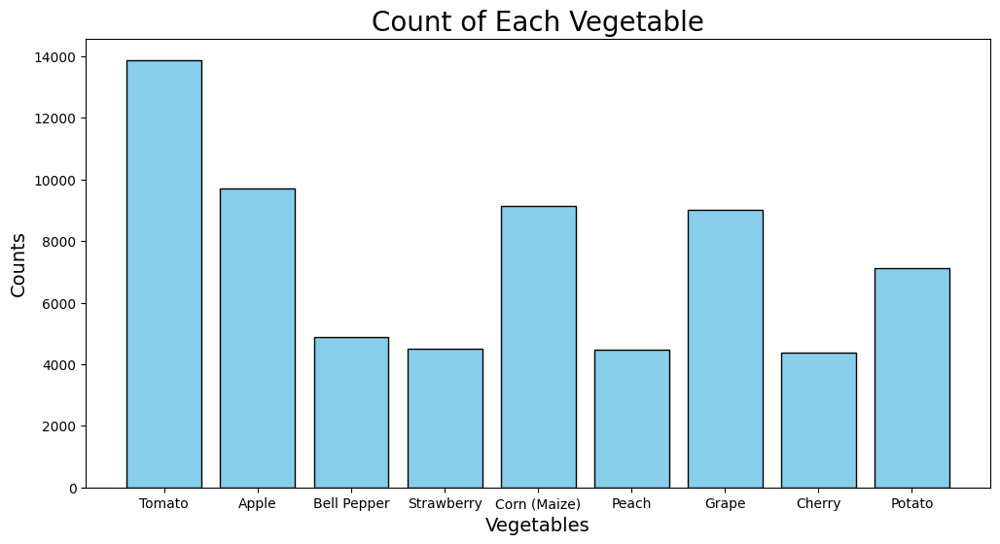

In [7]:
plants={}
dis = {}
for plant in os.listdir("/kaggle/input/plant-village-dataset-updated"):
    plant_count = 0
    path = f"/kaggle/input/plant-village-dataset-updated/{plant}/"
    for disease in os.listdir(path+"Train"):
        dis_count = 0
        for file in os.listdir(path+f"Train/{disease}"):
            plant_count+=1
            dis_count +=1
        dis[plant+" "+disease] = dis_count
    for disease in os.listdir(path+"Test"):
        for file in os.listdir(path+f"Test/{disease}"):
            plant_count+=1    
    for disease in os.listdir(path+"Val"):
        for file in os.listdir(path+f"Val/{disease}"):
            plant_count+=1
    plants[plant] = plant_count
    
categories = list(plants.keys())
counts = list(plants.values())

# Plotting the bar plot
plt.figure(figsize=(12, 6))
plt.bar(categories, counts, color='skyblue', edgecolor='black')
plt.xlabel('Vegetables', fontsize=14)
plt.ylabel('Counts', fontsize= 14)
plt.title('Count of Each Vegetable', fontsize=20)
plt.xticks(ha='center')  # Rotate x-axis labels for better readability
plt.show()

### Plotting the number of diseases per each plant

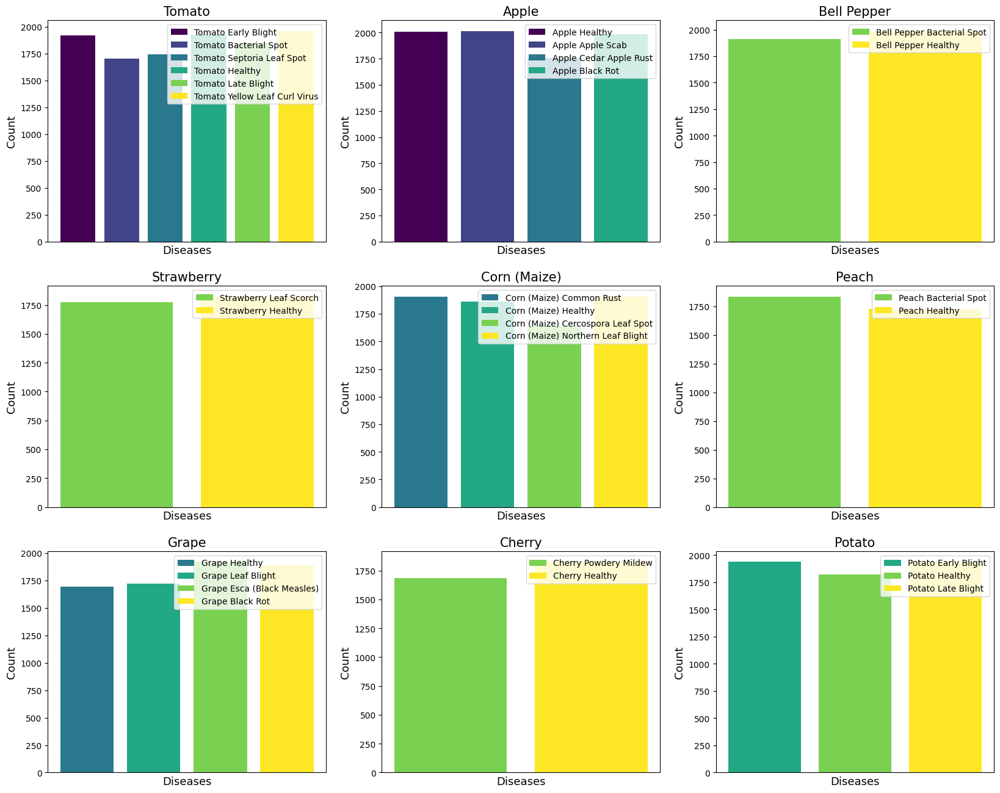

In [8]:
plts = os.listdir("/kaggle/input/plant-village-dataset-updated")
x = list(dis.keys())
y = list(dis.values())
colors = plt.cm.viridis(np.linspace(0, 1, 6)) 
fig, axes = plt.subplots(3, 3, figsize=(20, 16))
axes[0, 0].bar(x[:6], y[:6], color=colors[:6], label=x[:6])
axes[0, 1].bar(x[6:10], y[6:10], color=colors[:4], label=x[6:10])
axes[0, 2].bar(x[10:12], y[10:12], color=colors[-2:], label=x[10:12])
axes[1, 0].bar(x[12:14], y[12:14], color=colors[-2:], label=x[12:14])
axes[1, 1].bar(x[14:18], y[14:18], color=colors[-4:], label=x[14:18])
axes[1, 2].bar(x[18:20], y[18:20], color=colors[-2:], label=x[18:20])
axes[2, 0].bar(x[20:24], y[20:24], color=colors[-4:], label=x[20:24])
axes[2, 1].bar(x[24:26], y[24:26], color=colors[-2:], label=x[24:26])
axes[2, 2].bar(x[26:29], y[26:29], color=colors[-3:], label=x[26:29])
for i in range(3):
    for j in range(3):
        idx = i * 3 + j
        axes[i, j].set_xticks([])
        axes[i, j].set_xlabel('Diseases', fontsize=13)
        axes[i, j].set_ylabel('Count', fontsize=13)
        axes[i, j].set_title(plts[idx], fontsize=15)
        axes[i, j].legend()

plt.show()

### Plotting the 32X32 patch format of a image

Image size: 224 X 224
Patch size: 32 X 32
Patches per image: 49
Elements per patch: 3072


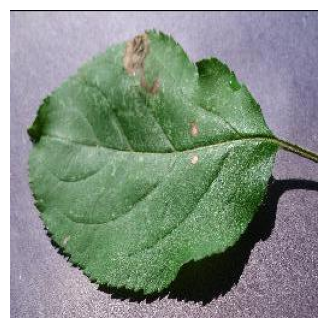

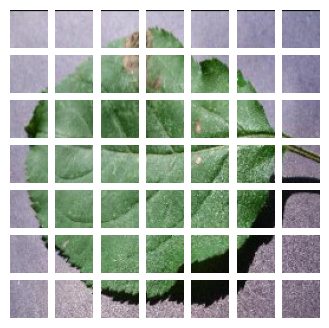

In [9]:
image_size = 224 
img_height, img_width = 512, 512
patch_size = 32
num_patches = (image_size // patch_size) ** 2
class Patches(layers.Layer):
    
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        super(Patches, self).__init__()
        self.patch_size = patch_size
    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches
    
    
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.figure(figsize=(4, 4))

target = "/kaggle/input/plant-village-dataset-updated/Apple/Train/Black Rot"
random_num = random.choice(os.listdir(target))
image = mpimg.imread("/kaggle/input/plant-village-dataset-updated/Apple/Train/Black Rot/" + random_num)
plt.imshow(image.astype("uint8"))
plt.axis("off")
resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")
n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")


# **Model Development**

### Enter the plant name for which you want to develop the model, as the variable

plant = "Strawberry"

### Declaring the paths for the training, testing, validation path, labels for the given plant diseases and the output length

train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(f"/kaggle/input/plant-village-dataset-updated/{plant}/Train")
out_len = len(out_labels)

### Declaring the batch size of 64 and the image size of 224X224 pixels


batch_size = 64
img_height = 224

### Declare the ImageDataGenerator for the train_datagen and test_datagen, val_datagen. For train_datagen the images are augumented and for all the three datagenerators the pixels are scaled

train_datagen = ImageDataGenerator(rescale = 1./255.,rotation_range=20,shear_range=0.15,horizontal_flip=True,)
val_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

### Declaring the train, test and valid sets for the input to the model, making every image to be of the size 224X224 pixels


train_set = train_datagen.flow_from_directory(train_path,target_size = (224,224),batch_size = 64,shuffle = True,class_mode = 'categorical')
val_set = val_datagen.flow_from_directory(val_path,target_size = (224, 224),batch_size = 64,shuffle = False,class_mode = 'categorical')
test_set = val_datagen.flow_from_directory(test_path,target_size = (224, 224),batch_size = 64,shuffle = False,class_mode = 'categorical')

### Loading the pretrained VIT model with RESNET50 as backbone with 32 patch size and pretrained on ImageNet-21k dataset. Building a classifier head over the pretrained VIT Model with out_len as the output shape which is equal to the number of disease of plant

fe_L2 = hub.KerasLayer("https://tfhub.dev/sayakpaul/vit_r50_l32_fe/1",input_shape = (224,224,3),trainable = False,name = "Pre_Trained_")
VIT = tf.keras.Sequential([
    fe_L2,
    layers.Dense(128,activation = "relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation = "softmax", name = "output_layer")
])

VIT.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),metrics = ["accuracy"])

### Training the model for 10 epochs

epochs = 10
r=VIT.fit(train_set,epochs = epochs,validation_data = val_set,steps_per_epoch=len(train_set),validation_steps = len(val_set))

### Saving the model with plant name

model_name = plant+"_model"
VIT.save(model_name)

### Predicting the test_set for the model

Y_pred = VIT.predict(test_set, steps = len(test_set) )
y_pred = np.argmax(Y_pred, axis=1)

### Plotting the confusion matrix for given y_pred and y_true

cf = confusion_matrix(test_set.classes, y_pred)
list = os.listdir(f"/kaggle/input/plant-village-dataset-updated/{plant}/Train")
plt.figure(figsize=(8, 6))
sns.heatmap(cf, annot=True, fmt='d', cmap='Blues',xticklabels=out_labels,yticklabels=out_labels)
plt.title(f'Confusion Matrix of {plant} with Accuracy : {accuracy_score(test_set.classes, y_pred) * 100:.2f}%')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt_name = plant+"_CF.png"
plt.savefig(plt_name)
plt.show()

### Printing the classification report

print('-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_')
print(classification_report(test_set.classes, y_pred, target_names=out_labels))

### Plotting the model Accuracy and Loss Graphs

epochs = [i for i in range(10)]
fig , ax = plt.subplots(1,2)
train_acc = r.history['accuracy']
train_loss = r.history['loss']
val_acc = r.history['val_accuracy']
val_loss = r.history['val_loss']
fig.set_size_inches(16,9)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'r-o' , label = 'Testing Loss')
ax[1].set_title('Testing Accuracy & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

**VEGETABLE ONE**

In [10]:
plant = "Tomato"

In [11]:
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(f"/kaggle/input/plant-village-dataset-updated/{plant}/Train")
out_len = len(out_labels)

In [12]:
batch_size = 64
img_height = 224

In [13]:
train_datagen = ImageDataGenerator(rescale = 1./255.,rotation_range=20,shear_range=0.15,horizontal_flip=True,)
val_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

In [14]:
train_set = train_datagen.flow_from_directory(train_path,target_size = (224,224),batch_size = 64,shuffle = True,class_mode = 'categorical')
val_set = val_datagen.flow_from_directory(val_path,target_size = (224, 224),batch_size = 64,shuffle = False,class_mode = 'categorical')
test_set = val_datagen.flow_from_directory(test_path,target_size = (224, 224),batch_size = 64,shuffle = False,class_mode = 'categorical')

Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 280 images belonging to 6 classes.


**VIT-R26-S32**

In [15]:
import tensorflow_hub as hub
#model = tf.keras.Sequential([
#    hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-r26-s32-medaug-classification/1")
#])
#predictions = model.predict(images) 


fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-r26-s32-medaug-classification/1",input_shape = (224,224,3),trainable = False,name = "Pre_Trained_")
VIT = tf.keras.Sequential([
    fe_L2,
    layers.Dense(128,activation = "relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation = "softmax", name = "output_layer")
])

VIT.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),metrics = ["accuracy"])

In [16]:
epochs = 10
r=VIT.fit(train_set,epochs = epochs,validation_data = val_set,steps_per_epoch=len(train_set),validation_steps = len(val_set))

Epoch 1/10
174/174 [==============================] - 283s 1s/step - loss: 1.4529 - accuracy: 0.5049 - val_loss: 0.7793 - val_accuracy: 0.7535
Epoch 2/10
174/174 [==============================] - 150s 860ms/step - loss: 0.7876 - accuracy: 0.7152 - val_loss: 0.5497 - val_accuracy: 0.8236
Epoch 3/10
174/174 [==============================] - 152s 871ms/step - loss: 0.6027 - accuracy: 0.7837 - val_loss: 0.4273 - val_accuracy: 0.8713
Epoch 4/10
174/174 [==============================] - 156s 895ms/step - loss: 0.5044 - accuracy: 0.8244 - val_loss: 0.3597 - val_accuracy: 0.8930
Epoch 5/10
174/174 [==============================] - 157s 903ms/step - loss: 0.4423 - accuracy: 0.8445 - val_loss: 0.3026 - val_accuracy: 0.9122
Epoch 6/10
174/174 [==============================] - 156s 897ms/step - loss: 0.3799 - accuracy: 0.8676 - val_loss: 0.2781 - val_accuracy: 0.9182
Epoch 7/10
174/174 [==============================] - 155s 889ms/step - loss: 0.3460 - accuracy: 0.8778 - val_loss: 0.2579 - va

In [17]:
model_name = plant+"_model"
VIT.save(model_name)

5/5 [==============================] - 16s 4s/step


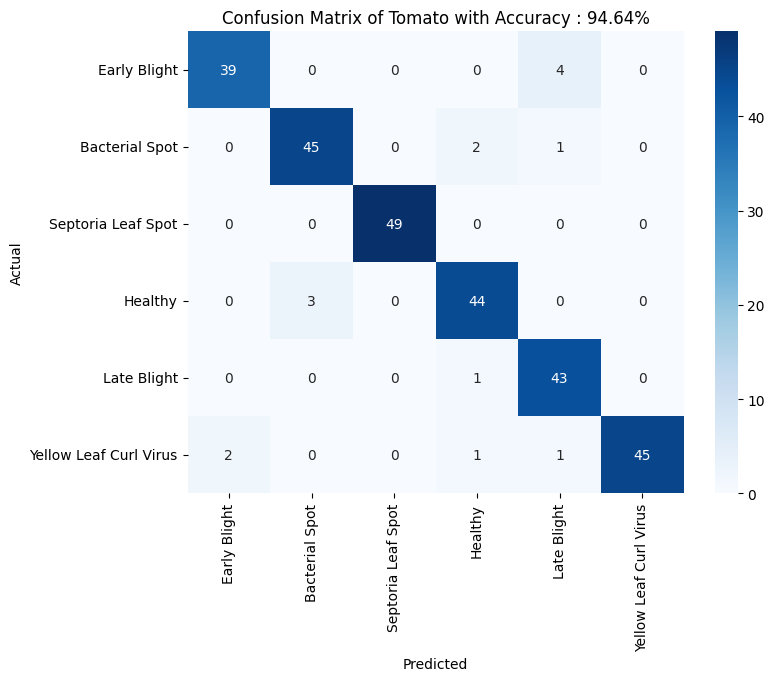

-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_
                        precision    recall  f1-score   support

          Early Blight       0.95      0.91      0.93        43
        Bacterial Spot       0.94      0.94      0.94        48
    Septoria Leaf Spot       1.00      1.00      1.00        49
               Healthy       0.92      0.94      0.93        47
           Late Blight       0.88      0.98      0.92        44
Yellow Leaf Curl Virus       1.00      0.92      0.96        49

              accuracy                           0.95       280
             macro avg       0.95      0.95      0.95       280
          weighted avg       0.95      0.95      0.95       280



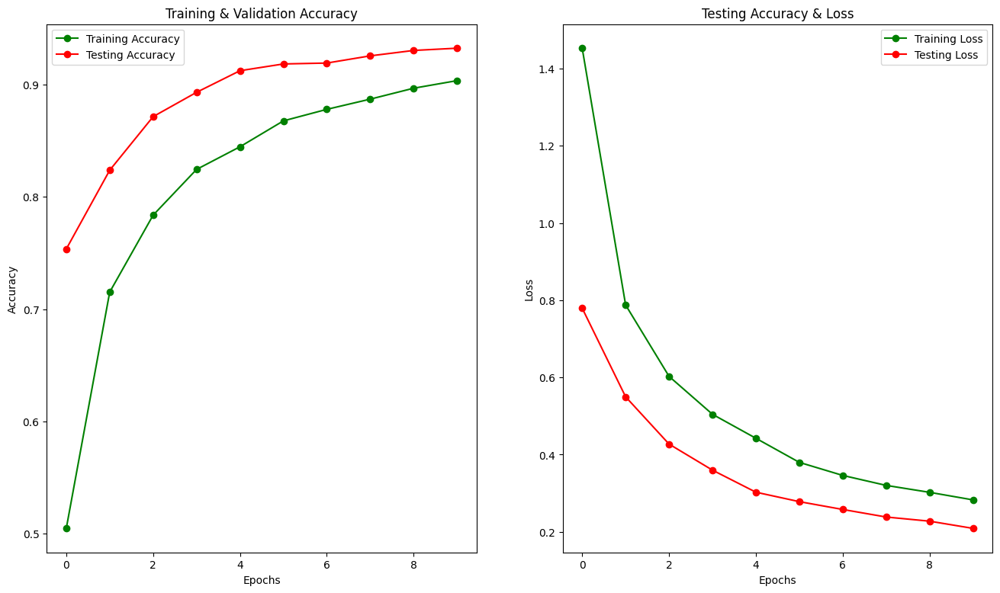

In [18]:
Y_pred = VIT.predict(test_set, steps = len(test_set) )
y_pred = np.argmax(Y_pred, axis=1)

cf = confusion_matrix(test_set.classes, y_pred)
list = os.listdir(f"/kaggle/input/plant-village-dataset-updated/{plant}/Train")
plt.figure(figsize=(8, 6))
sns.heatmap(cf, annot=True, fmt='d', cmap='Blues',xticklabels=out_labels,yticklabels=out_labels)
plt.title(f'Confusion Matrix of {plant} with Accuracy : {accuracy_score(test_set.classes, y_pred) * 100:.2f}%')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt_name = plant+"_CF.png"
plt.savefig(plt_name)
plt.show()


print('-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_')
print(classification_report(test_set.classes, y_pred, target_names=out_labels))

epochs = [i for i in range(10)]
fig , ax = plt.subplots(1,2)
train_acc = r.history['accuracy']
train_loss = r.history['loss']
val_acc = r.history['val_accuracy']
val_loss = r.history['val_loss']
fig.set_size_inches(16,9)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'r-o' , label = 'Testing Loss')
ax[1].set_title('Testing Accuracy & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [19]:
#3 clients 

import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 3
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-r26-s32-medaug-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 280 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Epoch 1/2
174/174 [==============================] - 54s 253ms/step - loss: 1.4190 - accuracy: 0.5231
Epoch 2/2
39/39 [==============================] - 16s 382ms/step - loss: 0.4475 - accuracy: 0.8725
Client 1: Validation Accuracy = 0.8725
Epoch 1/2
174/174 [==============================] - 40s 217ms/step - loss: 1.4385 - accuracy: 0.5186
Epoch 2/2
39/39 [==============================] - 10s 218ms/step - loss: 0.4471 - accuracy: 0.8661
Client 2: Validation Accuracy = 0.8661
Epoch 1/2
174/174 [==============================] - 38s 202ms/step - loss: 1.4699 - accuracy: 0.5124
Epoch 2/2
39/39 [==================

In [20]:
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 5
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-r26-s32-medaug-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 280 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Epoch 1/2
174/174 [==============================] - 52s 243ms/step - loss: 1.4205 - accuracy: 0.5182
Epoch 2/2
39/39 [==============================] - 16s 372ms/step - loss: 0.4873 - accuracy: 0.8549
Client 1: Validation Accuracy = 0.8549
Epoch 1/2
174/174 [==============================] - 39s 209ms/step - loss: 1.4259 - accuracy: 0.5090
Epoch 2/2
39/39 [==============================] - 10s 218ms/step - loss: 0.4997 - accuracy: 0.8421
Client

In [21]:
#10 clients

import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 10
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-r26-s32-medaug-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 280 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Epoch 1/2
174/174 [=====

**VIT-L16**

In [23]:
import tensorflow_hub as hub
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-l16-classification/1",input_shape = (224,224,3),trainable = False,name = "Pre_Trained_")
VIT = tf.keras.Sequential([
    fe_L2,
    layers.Dense(128,activation = "relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation = "softmax", name = "output_layer")
])

VIT.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),metrics = ["accuracy"])

In [24]:
epochs = 10
r=VIT.fit(train_set,epochs = epochs,validation_data = val_set,steps_per_epoch=len(train_set),validation_steps = len(val_set))

model_name = plant+"_model"
VIT.save(model_name)

Epoch 1/10
174/174 [==============================] - 645s 4s/step - loss: 1.3430 - accuracy: 0.5484 - val_loss: 0.5370 - val_accuracy: 0.8729
Epoch 2/10
174/174 [==============================] - 621s 4s/step - loss: 0.5573 - accuracy: 0.8153 - val_loss: 0.3131 - val_accuracy: 0.9214
Epoch 3/10
174/174 [==============================] - 620s 4s/step - loss: 0.3906 - accuracy: 0.8748 - val_loss: 0.2237 - val_accuracy: 0.9435
Epoch 4/10
174/174 [==============================] - 620s 4s/step - loss: 0.3111 - accuracy: 0.9018 - val_loss: 0.1766 - val_accuracy: 0.9547
Epoch 5/10
174/174 [==============================] - 621s 4s/step - loss: 0.2548 - accuracy: 0.9203 - val_loss: 0.1524 - val_accuracy: 0.9595
Epoch 6/10
174/174 [==============================] - 621s 4s/step - loss: 0.2271 - accuracy: 0.9301 - val_loss: 0.1293 - val_accuracy: 0.9639
Epoch 7/10
174/174 [==============================] - 621s 4s/step - loss: 0.2033 - accuracy: 0.9358 - val_loss: 0.1240 - val_accuracy: 0.9619

5/5 [==============================] - 19s 4s/step


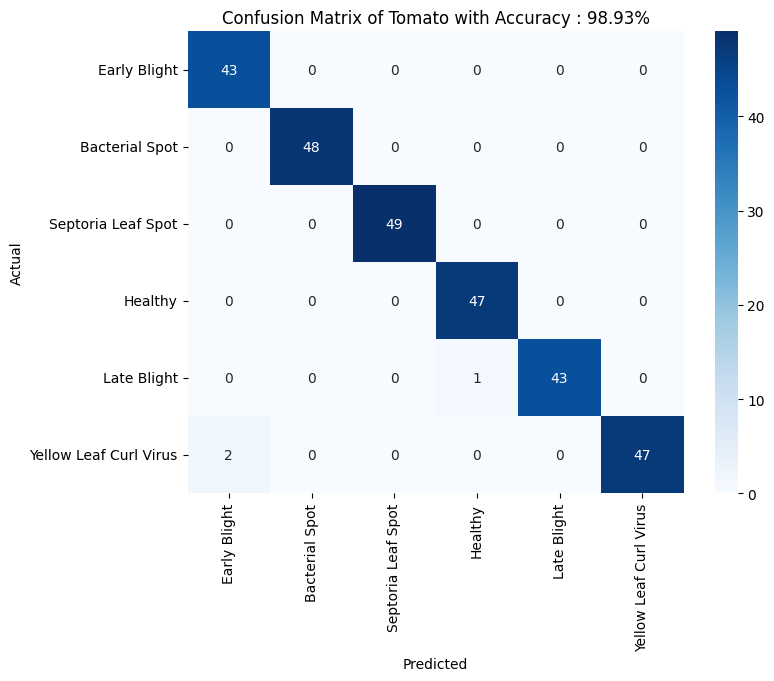

-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_
                        precision    recall  f1-score   support

          Early Blight       0.96      1.00      0.98        43
        Bacterial Spot       1.00      1.00      1.00        48
    Septoria Leaf Spot       1.00      1.00      1.00        49
               Healthy       0.98      1.00      0.99        47
           Late Blight       1.00      0.98      0.99        44
Yellow Leaf Curl Virus       1.00      0.96      0.98        49

              accuracy                           0.99       280
             macro avg       0.99      0.99      0.99       280
          weighted avg       0.99      0.99      0.99       280



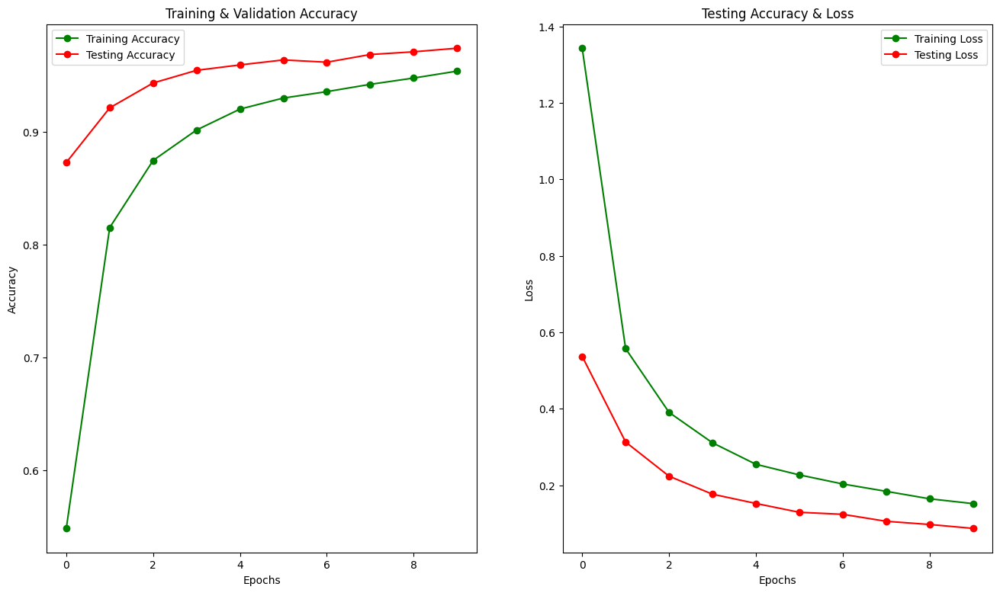

In [25]:
Y_pred = VIT.predict(test_set, steps = len(test_set) )
y_pred = np.argmax(Y_pred, axis=1)

cf = confusion_matrix(test_set.classes, y_pred)
list = os.listdir(f"/kaggle/input/plant-village-dataset-updated/{plant}/Train")
plt.figure(figsize=(8, 6))
sns.heatmap(cf, annot=True, fmt='d', cmap='Blues',xticklabels=out_labels,yticklabels=out_labels)
plt.title(f'Confusion Matrix of {plant} with Accuracy : {accuracy_score(test_set.classes, y_pred) * 100:.2f}%')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt_name = plant+"_CF.png"
plt.savefig(plt_name)
plt.show()


print('-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_')
print(classification_report(test_set.classes, y_pred, target_names=out_labels))

epochs = [i for i in range(10)]
fig , ax = plt.subplots(1,2)
train_acc = r.history['accuracy']
train_loss = r.history['loss']
val_acc = r.history['val_accuracy']
val_loss = r.history['val_loss']
fig.set_size_inches(16,9)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'r-o' , label = 'Testing Loss')
ax[1].set_title('Testing Accuracy & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [26]:
#3 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 3
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-l16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 280 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Epoch 1/2
174/174 [==============================] - 525s 3s/step - loss: 1.1191 - accuracy: 0.6021
Epoch 2/2
39/39 [==============================] - 122s 3s/step - loss: 0.3021 - accuracy: 0.9246
Client 1: Validation Accuracy = 0.9246
Epoch 1/2
174/174 [==============================] - 510s 3s/step - loss: 1.1448 - accuracy: 0.5933
Epoch 2/2
39/39 [==============================] - 116s 3s/step - loss: 0.2924 - accuracy: 0.9255
Client 2: Validation Accuracy = 0.9255
Epoch 1/2
174/174 [==============================] - 509s 3s/step - loss: 1.1338 - accuracy: 0.5968
Epoch 2/2
39/39 [============================

In [ ]:
#5 clients

import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 5
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-l16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 280 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Epoch 1/2
174/174 [==============================] - 520s 3s/step - loss: 1.3465 - accuracy: 0.5469
Epoch 2/2
39/39 [==============================] - 121s 3s/step - loss: 0.3087 - accuracy: 0.9122
Client 1: Validation Accuracy = 0.9122
Epoch 1/2
174/174 [==============================] - 509s 3s/step - loss: 1.3223 - accuracy: 0.5512
Epoch 2/2
39/39 [==============================] - 116s 3s/step - loss: 0.3095 - accuracy: 0.9182
Client 2: Vali

In [ ]:
#10 clients

import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 10
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-l16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


**VIT-B16**

In [ ]:
import tensorflow_hub as hub
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b16-classification/1",input_shape = (224,224,3),trainable = False,name = "Pre_Trained_")
VIT = tf.keras.Sequential([
    fe_L2,
    layers.Dense(128,activation = "relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation = "softmax", name = "output_layer")
])

VIT.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),metrics = ["accuracy"])


epochs = 10
r=VIT.fit(train_set,epochs = epochs,validation_data = val_set,steps_per_epoch=len(train_set),validation_steps = len(val_set))

model_name = plant+"_model"
VIT.save(model_name)

In [ ]:
Y_pred = VIT.predict(test_set, steps = len(test_set) )
y_pred = np.argmax(Y_pred, axis=1)

cf = confusion_matrix(test_set.classes, y_pred)
list = os.listdir(f"/kaggle/input/plant-village-dataset-updated/{plant}/Train")
plt.figure(figsize=(8, 6))
sns.heatmap(cf, annot=True, fmt='d', cmap='Blues',xticklabels=out_labels,yticklabels=out_labels)
plt.title(f'Confusion Matrix of {plant} with Accuracy : {accuracy_score(test_set.classes, y_pred) * 100:.2f}%')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt_name = plant+"_CF.png"
plt.savefig(plt_name)
plt.show()


print('-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_')
print(classification_report(test_set.classes, y_pred, target_names=out_labels))

epochs = [i for i in range(10)]
fig , ax = plt.subplots(1,2)
train_acc = r.history['accuracy']
train_loss = r.history['loss']
val_acc = r.history['val_accuracy']
val_loss = r.history['val_loss']
fig.set_size_inches(16,9)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'r-o' , label = 'Testing Loss')
ax[1].set_title('Testing Accuracy & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
#3 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 3
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


In [ ]:
#5 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 5
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


In [ ]:
#10 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 10
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


**VIT_S16**

In [ ]:
import tensorflow_hub as hub
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-s16-classification/1",input_shape = (224,224,3),trainable = False,name = "Pre_Trained_")
VIT = tf.keras.Sequential([
    fe_L2,
    layers.Dense(128,activation = "relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation = "softmax", name = "output_layer")
])

VIT.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),metrics = ["accuracy"])


epochs = 10
r=VIT.fit(train_set,epochs = epochs,validation_data = val_set,steps_per_epoch=len(train_set),validation_steps = len(val_set))

model_name = plant+"_model"
VIT.save(model_name)

In [ ]:
Y_pred = VIT.predict(test_set, steps = len(test_set) )
y_pred = np.argmax(Y_pred, axis=1)

cf = confusion_matrix(test_set.classes, y_pred)
list = os.listdir(f"/kaggle/input/plant-village-dataset-updated/{plant}/Train")
plt.figure(figsize=(8, 6))
sns.heatmap(cf, annot=True, fmt='d', cmap='Blues',xticklabels=out_labels,yticklabels=out_labels)
plt.title(f'Confusion Matrix of {plant} with Accuracy : {accuracy_score(test_set.classes, y_pred) * 100:.2f}%')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt_name = plant+"_CF.png"
plt.savefig(plt_name)
plt.show()


print('-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_')
print(classification_report(test_set.classes, y_pred, target_names=out_labels))

epochs = [i for i in range(10)]
fig , ax = plt.subplots(1,2)
train_acc = r.history['accuracy']
train_loss = r.history['loss']
val_acc = r.history['val_accuracy']
val_loss = r.history['val_loss']
fig.set_size_inches(16,9)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'r-o' , label = 'Testing Loss')
ax[1].set_title('Testing Accuracy & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
#3 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 3
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-s16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


In [ ]:
#5 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 5
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-s16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


In [ ]:
#10 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 10
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-s16-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


**VIT-B32**

In [ ]:
import tensorflow_hub as hub
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b32-classification/1",input_shape = (224,224,3),trainable = False,name = "Pre_Trained_")
VIT = tf.keras.Sequential([
    fe_L2,
    layers.Dense(128,activation = "relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation = "softmax", name = "output_layer")
])

VIT.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),metrics = ["accuracy"])


epochs = 10
r=VIT.fit(train_set,epochs = epochs,validation_data = val_set,steps_per_epoch=len(train_set),validation_steps = len(val_set))

model_name = plant+"_model"
VIT.save(model_name)

In [ ]:
Y_pred = VIT.predict(test_set, steps = len(test_set) )
y_pred = np.argmax(Y_pred, axis=1)

cf = confusion_matrix(test_set.classes, y_pred)
list = os.listdir(f"/kaggle/input/plant-village-dataset-updated/{plant}/Train")
plt.figure(figsize=(8, 6))
sns.heatmap(cf, annot=True, fmt='d', cmap='Blues',xticklabels=out_labels,yticklabels=out_labels)
plt.title(f'Confusion Matrix of {plant} with Accuracy : {accuracy_score(test_set.classes, y_pred) * 100:.2f}%')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt_name = plant+"_CF.png"
plt.savefig(plt_name)
plt.show()


print('-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_>>>>Classification Report<<<<-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_-_')
print(classification_report(test_set.classes, y_pred, target_names=out_labels))

epochs = [i for i in range(10)]
fig , ax = plt.subplots(1,2)
train_acc = r.history['accuracy']
train_loss = r.history['loss']
val_acc = r.history['val_accuracy']
val_loss = r.history['val_loss']
fig.set_size_inches(16,9)

ax[0].plot(epochs , train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'ro-' , label = 'Testing Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'r-o' , label = 'Testing Loss')
ax[1].set_title('Testing Accuracy & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
#3 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 3
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b32-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


In [ ]:
#5 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 5
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b32-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


In [ ]:
#10 clients
import tensorflow as tf
import numpy as np
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import os

# Paths and parameters
plant = "Tomato"
train_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Train"
val_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Val"
test_path = f"/kaggle/input/plant-village-dataset-updated/{plant}/Test"
out_labels = os.listdir(train_path)
out_len = len(out_labels)
batch_size = 64
img_height = 224
NUM_CLIENTS = 10
NUM_ROUNDS = 4
EPOCHS_PER_CLIENT = 2

# Data generators
datagen = ImageDataGenerator(rescale=1./255.)

# Create the datasets
train_set = datagen.flow_from_directory(train_path, target_size=(224, 224), batch_size=batch_size, shuffle=True, class_mode='categorical')
val_set = datagen.flow_from_directory(val_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')
test_set = datagen.flow_from_directory(test_path, target_size=(224, 224), batch_size=batch_size, shuffle=False, class_mode='categorical')

# Function to create client-specific data generators
def create_client_data_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_gen = datagen.flow_from_directory(
            train_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=True,
            class_mode='categorical'
        )
        client_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_gen.samples = len(client_gen.filenames)
        client_generators.append(client_gen)
    return client_generators

# Function to create client-specific validation data generators
def create_client_val_generators(num_clients, dataset, batch_size):
    total_batches = len(dataset)
    client_val_generators = []
    for i in range(num_clients):
        start_idx = i * total_batches // num_clients
        end_idx = (i + 1) * total_batches // num_clients
        client_val_gen = datagen.flow_from_directory(
            val_path,
            target_size=(224, 224),
            batch_size=batch_size,
            shuffle=False,
            class_mode='categorical'
        )
        client_val_gen.filenames = dataset.filenames[start_idx:end_idx]
        client_val_gen.samples = len(client_val_gen.filenames)
        client_val_generators.append(client_val_gen)
    return client_val_generators

# Create client data generators
client_train_generators = create_client_data_generators(NUM_CLIENTS, train_set, batch_size)
client_val_generators = create_client_val_generators(NUM_CLIENTS, val_set, batch_size)

# Pretrained ViT model
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b32-classification/1", input_shape=(224, 224, 3), trainable=False, name="Pre_Trained_")

def create_model():
    model = tf.keras.Sequential([
        fe_L2,
        layers.Dense(128, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(out_len, activation="softmax", name="output_layer")
    ])
    model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=["accuracy"])
    return model

# Federated training loop
global_model = create_model()
for round_num in range(NUM_ROUNDS):
    client_models = []
    client_accuracies = []
    for client_index, client_gen in enumerate(client_train_generators):
        client_model = create_model()
        client_model.set_weights(global_model.get_weights())
        client_model.fit(client_gen, epochs=EPOCHS_PER_CLIENT)

        # Evaluate on client-specific validation data
        val_loss, val_acc = client_model.evaluate(client_val_generators[client_index])
        client_accuracies.append(val_acc)
        print(f'Client {client_index + 1}: Validation Accuracy = {val_acc:.4f}')

        client_models.append(client_model)

    # FedAvg aggregation
    new_weights = []
    for layer_index in range(len(global_model.get_weights())):
        layer_weights = np.mean([client_models[i].get_weights()[layer_index] for i in range(NUM_CLIENTS)], axis=0)
        new_weights.append(layer_weights)
    global_model.set_weights(new_weights)

    # Evaluate global model
    val_loss, val_acc = global_model.evaluate(val_set)
    print(f'Round {round_num + 1}: Validation Loss = {val_loss:.4f}, Validation Accuracy = {val_acc:.4f}')

# Final evaluation on the test set
test_loss, test_acc = global_model.evaluate(test_set)
print(f'Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}')


In [ ]:
import tensorflow_hub as hub
fe_L2 = hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b32-classification/1",input_shape = (224,224,3),trainable = False,name = "Pre_Trained_")
VIT = tf.keras.Sequential([
    fe_L2,
    layers.Dense(128,activation = "relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation = "softmax", name = "output_layer")
])

VIT.compile(loss = "categorical_crossentropy",optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),metrics = ["accuracy"])


epochs = 10
r=VIT.fit(train_set,epochs = epochs,validation_data = val_set,steps_per_epoch=len(train_set),validation_steps = len(val_set))

model_name = plant+"_model"
VIT.save(model_name)

import tensorflow_hub as hub
model = tf.keras.Sequential([
    hub.KerasLayer("https://www.kaggle.com/models/spsayakpaul/bit-resnet/TensorFlow2/bit-resnet152x2-224-classification/1")
])
predictions = model.predict(images) 